## Load Data

In [5]:
#!pip install pandas_profiling

In [6]:
#!pip install xgboost

In [7]:
#! python3 -m pip install --quiet scikit-optimize

In [8]:
#! python3 -m pip install --quiet pycaret

In [308]:
import pandas as pd
import numpy as np
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import xgboost
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import cross_validate, train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, KFold
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_objective, plot_histogram
from xgboost import XGBClassifier, XGBRFClassifier
from pycaret.classification import *

In [10]:
train = pd.read_csv('data/train.csv', index_col = 0)

## Exploratory Data Analysis

In [11]:
pp.ProfileReport(train)

In [12]:
## `is_business_travel_ready` is the same for all observations
print('is_business_travel_ready :', np.unique(train['is_business_travel_ready'])) 
train_df = train.drop(['is_business_travel_ready'], 1)

is_business_travel_ready : ['f']


In [13]:
print('\n minimum_nights > 10:', np.sum(train['minimum_nights']< 10) / len(train['minimum_nights']))

print('\n maximum_nights < 365:', np.sum(train['maximum_nights']> 365) / len(train['maximum_nights']))

print('\n bed_type: \n', train['bed_type'].value_counts())

print('\n require_guest_profile_picture: \n', train['require_guest_profile_picture'].value_counts())

print('\n require_guest_phone_verification: \n', train['require_guest_phone_verification'].value_counts())


 minimum_nights > 10: 0.9125090383224873

 maximum_nights < 365: 0.5195744241297386

 bed_type: 
 Real Bed         9641
Pull-out Sofa      23
Futon              12
Couch               3
Airbed              2
Name: bed_type, dtype: int64

 require_guest_profile_picture: 
 f    9454
t     227
Name: require_guest_profile_picture, dtype: int64

 require_guest_phone_verification: 
 f    9493
t     188
Name: require_guest_phone_verification, dtype: int64


- There are no missing values in the training set.
- `is_business_travel_ready` is the same for all observations, so it cannot provide any information for the price. I choose to remove it. 
- The distributions of `minimum_nights` and `maximum_nights` are highly skewed. There are over 90% of Airbnb properties whose minimum nights stay is less than 10 days. However, there are over 50% of Airbnb properties whose maximum nights stay is more than a year.
- Over 99% of `bed_type` is the same, indicating that this feature may not provide much information about the price.
- Over 97% of `require_guest_profile_picture` is the same, indicating that this feature may not provide much information about the price.
- Over 98% of `require_guest_phone_verification` is the same, indicating that this feature may not provide much information about the price.
- `require_guest_profile_picture` and `require_guest_phone_verification` are highly correlated. Because owners who need verification are often more cautious, those require phone verification are likely to require photo verification at the same time.
- `bedrooms`, `beds` and `bathrooms` are highly correlated. The number of beds has traditionally been a more high priority search parameter on Airbnb, as it is more relevant for the number of people accommodated than the number of bedrooms (and is still the second highest priority parameter when searching on the site. In addition, `guests_included` is correlated with these three variables.
- `number_of_reviews` and `reviews_per_month` are highly correlated. This is reasonable because the latter is the "average value" of the former.
- Surprisingly, `maximum_nights` and `room_type` are highly correlated. Maybe it's because customers prefer to stay in private rooms longer.
- From the correlation plots, it seems that `room_type`, `bathrooms`, `bedrooms`, `beds`, `cleaning_fee`, `guests_included`, and `neighbourhood` are influencing factors. 

## Data Preprocessing

#### `host_since`

This is a datetime column and should be converted into a metric that measures the number of days the host has been on the platform. I used today (November 5, 2020) to calculate this metric. 

In [14]:
train_df.host_since

id
727        8/1/13
6274      2/14/14
6025     10/19/17
8931       2/1/19
7524      1/24/15
           ...   
11933     6/26/19
10678     6/12/11
13466     5/26/14
2931       5/4/16
6378      3/21/16
Name: host_since, Length: 9681, dtype: object

In [15]:
# convert to datetime
train_df.host_since = pd.to_datetime(train_df.host_since) 

# calculate the number of days between the date that the host first joined Airbnb and today
train_df['host_days_active'] = (datetime(2020, 11, 5) - train_df.host_since).astype('timedelta64[D]')
train_df = train_df.drop('host_since', 1)

#### `last_review`

In [16]:
# convert to datetime
train_df.last_review = pd.to_datetime(train_df.last_review)

# Calculate the number of days between the last review and today
train_df['time_since_last_review'] = (datetime(2020, 11, 5) - train_df.last_review).astype('timedelta64[D]')
train_df = train_df.drop('last_review', 1)

#### `cancellation_policy`

In [17]:
train_df['cancellation_policy'].value_counts()

strict_14_with_grace_period    3396
flexible                       3160
moderate                       3096
super_strict_30                  26
super_strict_60                   3
Name: cancellation_policy, dtype: int64

Since the super strict options are only available to long-term Airbnb hosts and is invitation only, it is clear that the super strict options are stricter than "strict_14_with_grace_period". As the number of "super strict" is too small, I choose to combine it with "strict_14_with_grace_period" after EDA.

#### `bed_type`

In [18]:
train_df['bed_type'].value_counts()

Real Bed         9641
Pull-out Sofa      23
Futon              12
Couch               3
Airbed              2
Name: bed_type, dtype: int64

Similarly, I will convert `Couch` and `Airbed` into `other` after EDA.

#### `require_guest_phone_verification` and `require_guest_profile_picture`

In [19]:
train_df.groupby(by = 'require_guest_profile_picture').agg({'price': ['mean', 'median']})

price       
                                   mean median
require_guest_profile_picture                 
f                              2.486461      2
t                              2.889868      3

In [20]:
train_df.groupby(by = 'require_guest_phone_verification').agg({'price': ['mean', 'median']})

price       
                                      mean median
require_guest_phone_verification                 
f                                 2.488781      2
t                                 2.856383      3

Since `require_guest_phone_verification` and `require_guest_profile_picture` are highly correlated, and the mean and median prices for these two variables are very similar, we can simply drop one of them. I might drop `require_guest_profile_picture` after EDA because I think phone verification is more strict.

## Data Visualization

#### Binary Variable

In [21]:
def plot_categorical(par_name, ax, rename = None):
    df = train_df.groupby(by = ['price', par_name]).count().unstack(fill_value=0).stack().mean(axis=1)
    ind = df.unstack().columns
    
    p1 = ax.bar(ind, np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p2 = ax.bar(ind, np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]), bottom=np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p3 = ax.bar(ind, np.array(df.iloc[len(ind)*2:len(ind)*2+len(ind)]), bottom=np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]) + np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p4 = ax.bar(ind, np.array(df.iloc[len(ind)*3:len(ind)*3+len(ind)]), bottom=np.array(df.iloc[len(ind)*2:len(ind)*2+len(ind)]) + np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]) + np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))

    ax.set_title(f'Prices by {par_name}')
    ax.set_xticks(ind)
    if rename is None:
        ax.set_xticklabels(df.iloc[len(ind)*i:len(ind)*i+len(ind)].unstack().columns)
    else:
        ax.set_xticklabels(rename)
    ax.legend((p1[0], p2[0], p3[0], p4[0]), df.unstack().index)

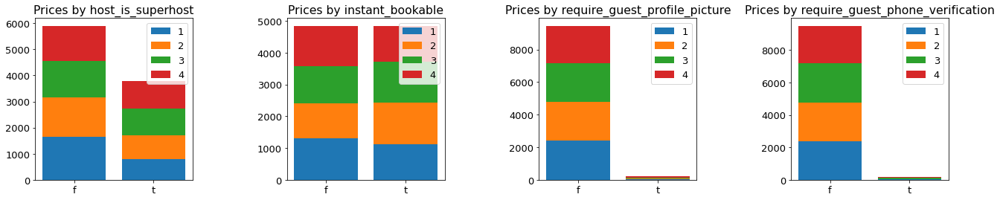

In [22]:
binary = ['host_is_superhost', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification']

plt.rcParams.update({'font.size': 13})
fig, axs = plt.subplots(nrows=1, ncols=len(binary), figsize=(22, 4))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.6)
for i in range(len(binary)):
    plot_categorical(binary[i], axs[i])

#### Categorical Variable

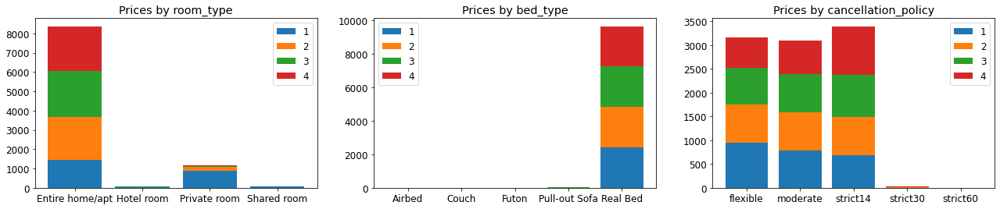

In [23]:
categorical = ['room_type', 'bed_type', 'cancellation_policy']

plt.rcParams.update({'font.size': 12})
fig, axs = plt.subplots(nrows=1, ncols=len(categorical), figsize=(22, 4))
for i in range(len(categorical)):
    if i == 2:
        plot_categorical(categorical[i], axs[i], rename = ['flexible', 'moderate', 'strict14', 'strict30', 'strict60'])
    else:
        plot_categorical(categorical[i], axs[i])

#### `neighbourhood`

maybe add a map

In [24]:
train_df['neighbourhood'].value_counts()

Palermo                3302
Recoleta               1661
San Nicolás             595
Retiro                  495
Belgrano                416
Monserrat               390
San Telmo               389
Almagro                 379
Balvanera               365
Villa Crespo            310
Colegiales              183
Núñez                   175
Chacarita               168
Caballito               143
Puerto Madero           112
Villa Urquiza            84
Barracas                 58
Constitución             57
Saavedra                 41
La Boca                  39
Boedo                    35
Flores                   30
Coghlan                  28
Villa Ortúzar            26
Parque Patricios         24
Villa Devoto             22
San Cristóbal            19
Villa del Parque         19
Parque Chacabuco         18
Parque Chas              17
Agronomía                15
Villa General Mitre      10
Villa Pueyrredón          9
Liniers                   8
Villa Luro                6
Floresta            

#### Numerical variable

In [25]:
def plot_numerical(par_name, ax):
    df=train_df[['price', par_name]]
    
    df.boxplot(column = par_name, by = 'price', ax = ax)
    title_boxplot = f'Prices by {par_name}'
    ax.set_title(title_boxplot)
    ax.set_ylabel(par_name)

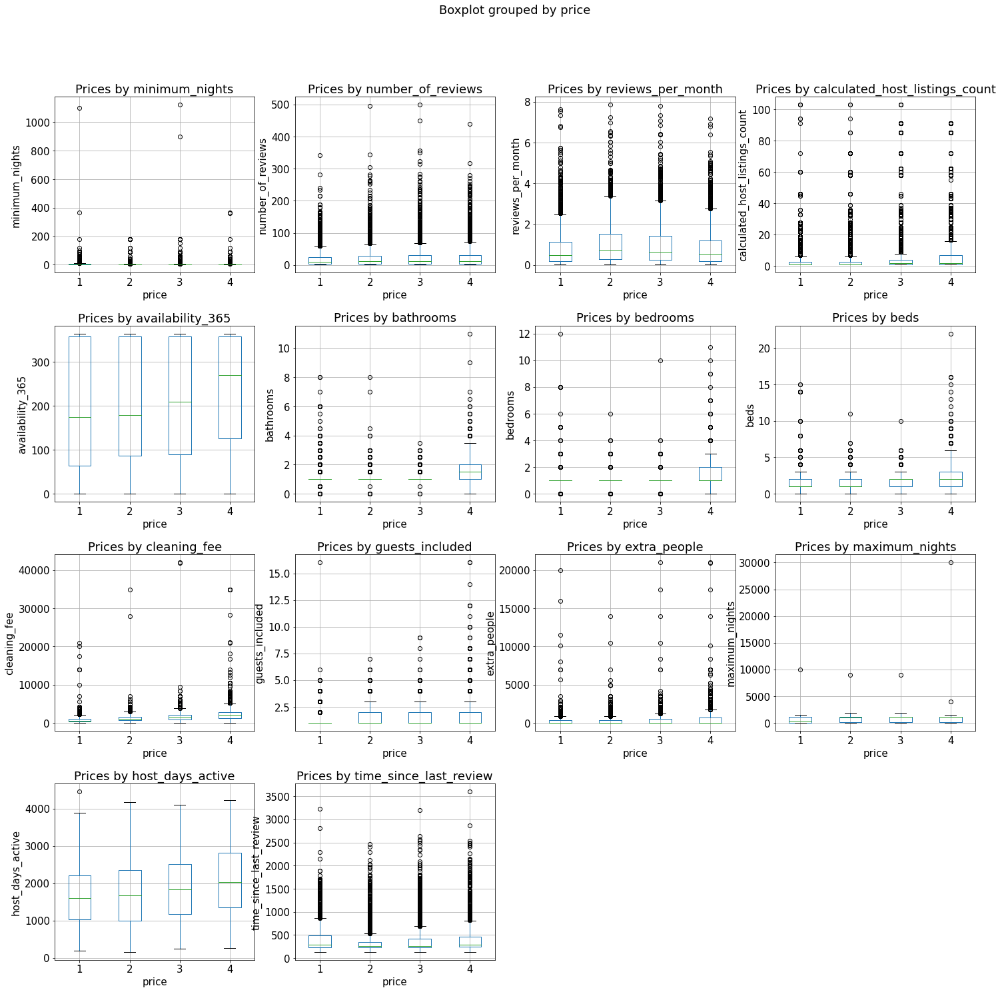

In [26]:
numerical = np.delete(np.array(train_df._get_numeric_data().columns), 
                      np.where(np.array(train_df._get_numeric_data().columns) == 'price'))

plt.rcParams.update({'font.size': 15})
fig, axs = plt.subplots(nrows=4, ncols=len(numerical) // 4 + 1, figsize=(24, 24))
fig.suptitle('My Own Title',backgroundcolor='white', color='black')
plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.6, hspace=0.3)
axs[3,2].set_axis_off()
axs[3,3].set_axis_off()
for i in range(len(numerical)):
    plot_numerical(numerical[i], axs[i // 4, i % 4])

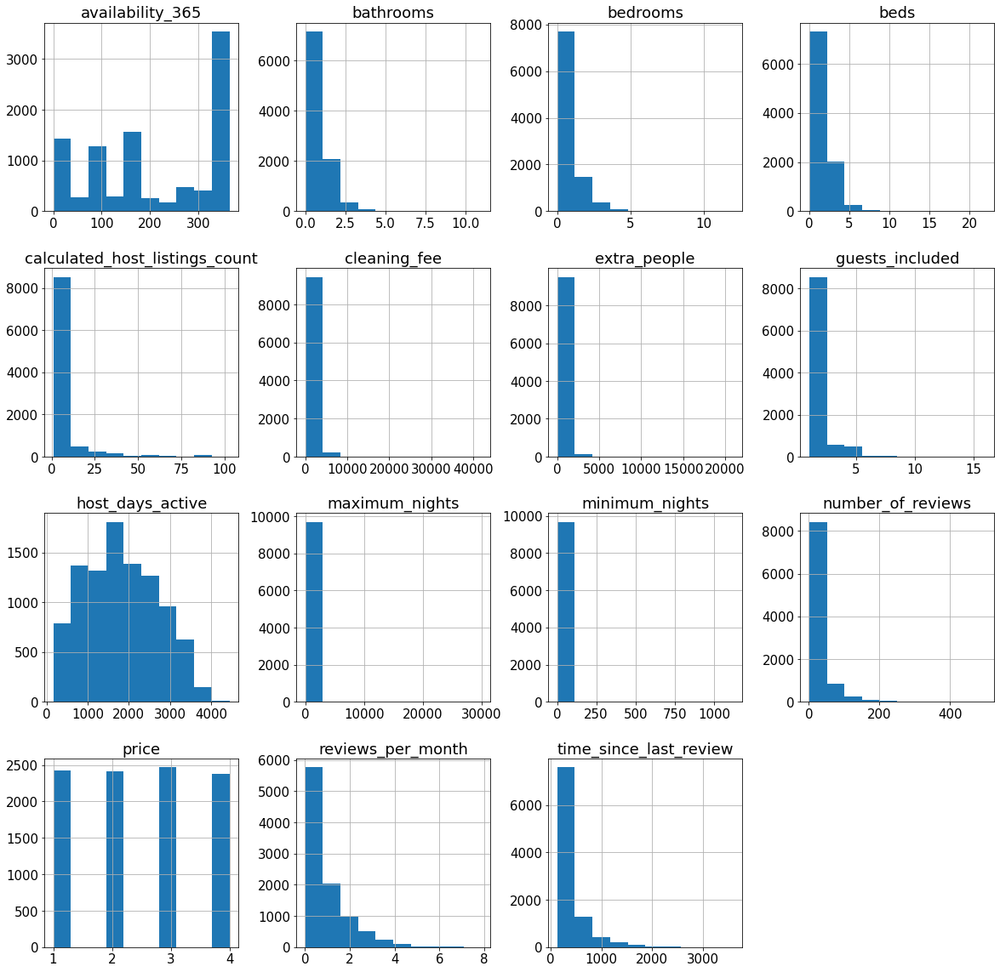

In [27]:
train_df._get_numeric_data().hist(figsize=(20,20));

## Prepare the data for modeling

In [254]:
## bed_type
bed_others = ['Couch', 'Airbed']
bed_keep = list(set(train_df.bed_type) - set(bed_others))
train_df.loc[~train_df.bed_type.isin(bed_keep), 'bed_type'] = 'other'

## neighbourhood
#other = ['Vélez Sársfield', 'Villa Real', 'Mataderos']
#train_df = train_df.loc[~train_df.neighbourhood.isin(other)]
other = ['Vélez Sársfield', 'Floresta', 'Villa Luro', 'La Paternal', 'Villa Santa Rita', 'Mataderos', 'Villa Real', 'Monte Castro', 'Versalles', 'Parque Avellaneda',  'Nueva Pompeya']
keep = list(set(train_df.neighbourhood) - set(other))
train_df.loc[~train_df.neighbourhood.isin(keep), 'neighbourhood'] = 'other'

# Replacing cancellation_policy categories
train_df.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period'
    }, inplace=True)

## require_guest_profile_picture
train_df = train_df.drop('require_guest_profile_picture', 1)

## instant_bookable
train_df = train_df.drop('instant_bookable', 1)

### check data type

In [255]:
len(train_df.columns)

21

In [256]:
train_df.dtypes

neighbourhood                        object
room_type                            object
minimum_nights                        int64
number_of_reviews                     int64
reviews_per_month                   float64
calculated_host_listings_count        int64
availability_365                      int64
host_is_superhost                    object
bathrooms                           float64
bedrooms                              int64
beds                                  int64
bed_type                             object
cleaning_fee                          int64
guests_included                       int64
extra_people                          int64
maximum_nights                        int64
cancellation_policy                  object
require_guest_phone_verification     object
price                                 int64
host_days_active                    float64
time_since_last_review              float64
dtype: object

## Modeling

In [257]:
X = train_df.drop('price', axis=1)
y = train_df.price

## encode `price`
encoder = LabelEncoder() 
y = encoder.fit_transform(np.array(y))

In [260]:
numeric = np.array(X._get_numeric_data().columns)
categorical = np.delete(X.columns, np.isin(np.array(X.columns), numeric))

#### Seperate train and test data

In [258]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state = 0)

#### Standardize data

The data has both numeric and categorical variables, and I want to standardize the numeric variables but leave the dummies as they are.

In [261]:
X_categorical = pd.get_dummies(X[categorical])
scaler = StandardScaler()
X_numeric_std = pd.DataFrame(data=scaler.fit_transform(X[numeric]), columns=numeric, index = X_categorical.index)
X_std = pd.concat([X_numeric_std, X_categorical], axis=1, sort=False)

### Try many classification models using `pycaret`

`pycaret` presents a nice API that automates most of the boilerplate work in setting up a machine learning pipeline.

In [262]:
# load data
data = X_std.copy()
data['price'] = y

`%%capture` will suppress the output of the cell. Since we have done a more detailed EDA before, we can skip it here.

In [263]:
%%capture
clfs = setup(
    data = data, 
    target = 'price',
    silent=True, 
    session_id=1, ## random_state
);

The first step is to train all the models in the model library (sklearn, etc.) using default hyperparameters and evaluates performance metrics using cross validation. It returns the trained model object. Here, I use "Accuracy" as evaluation metric. 

The output of the function is a table showing averaged score of all models across the folds. By default, the number of folds is set to 10. The table is sorted (highest to lowest) by the metric of choice. 

In [264]:
top = compare_models(sort = 'Accuracy', n_select = 7)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.5376,0.7914,0.5399,0.5443,0.5402,0.3831,0.3835,0.1190
rf,Random Forest Classifier,0.5366,0.7888,0.5390,0.5402,0.5379,0.3818,0.3821,0.3340
gbc,Gradient Boosting Classifier,0.5362,0.7855,0.5383,0.5442,0.5392,0.3811,0.3815,0.5850
xgboost,Extreme Gradient Boosting,0.5334,0.7864,0.5357,0.5393,0.5355,0.3774,0.3778,1.3850
catboost,CatBoost Classifier,0.5326,0.7882,0.5351,0.5371,0.5340,0.3765,0.3769,3.8020
et,Extra Trees Classifier,0.5185,0.7699,0.5208,0.5211,0.5195,0.3577,0.3578,0.1550
ada,Ada Boost Classifier,0.5043,0.7370,0.5070,0.5032,0.5031,0.3390,0.3393,0.0550
lr,Logistic Regression,0.4951,0.7546,0.4971,0.5037,0.4981,0.3263,0.3268,0.6580
ridge,Ridge Classifier,0.4810,0.0000,0.4832,0.4872,0.4814,0.3076,0.3084,0.1960
lda,Linear Discriminant Analysis,0.4801,0.7432,0.4804,0.5178,0.4888,0.3051,0.3087,0.0200


##### RF

In [265]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5339,0.7890,0.5364,0.5343,0.5339,0.3785,0.3786
1,0.5546,0.8066,0.5566,0.5573,0.5553,0.4058,0.4061
2,0.5472,0.7946,0.5500,0.5457,0.5463,0.3962,0.3963
3,0.4838,0.7747,0.4854,0.4993,0.4896,0.3108,0.3116
4,0.5590,0.7898,0.5610,0.5661,0.5618,0.4116,0.4119
5,0.5339,0.7884,0.5363,0.5394,0.5362,0.3783,0.3785
6,0.5421,0.7851,0.5452,0.5425,0.5423,0.3893,0.3893
7,0.5303,0.7849,0.5329,0.5318,0.5307,0.3736,0.3737
8,0.5510,0.7947,0.5537,0.5515,0.5512,0.4011,0.4012
9,0.5303,0.7806,0.5324,0.5343,0.5318,0.3734,0.3736


In [266]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5074,0.7663,0.5096,0.5094,0.5081,0.3430,0.3431
1,0.5000,0.7681,0.5015,0.5143,0.5049,0.3325,0.3337
2,0.5029,0.7679,0.5060,0.5030,0.5028,0.3372,0.3372
3,0.4779,0.7508,0.4796,0.4901,0.4820,0.3030,0.3038
4,0.5221,0.7570,0.5241,0.5399,0.5282,0.3621,0.3631
5,0.4867,0.7583,0.4886,0.4974,0.4909,0.3150,0.3155
6,0.5229,0.7647,0.5254,0.5295,0.5250,0.3635,0.3641
7,0.4712,0.7558,0.4737,0.4715,0.4713,0.2948,0.2948
8,0.5126,0.7720,0.5151,0.5127,0.5084,0.3499,0.3523
9,0.4756,0.7469,0.4776,0.4835,0.4771,0.3003,0.3013


In [267]:
## predict on hold-out data
predict_model(rf);
predict_model(tuned_rf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.5480,0.8026,0.5449,0.5556,0.5513,0.3975,0.3977


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.5157,0.7696,0.5138,0.5332,0.5217,0.3549,0.3560


In [268]:
#plot_model(tuned_rf, 'auc')
#plot_model(tuned_rf, 'pr')
#plot_model(tuned_rf, 'feature')

In [295]:
# finalize a model
rff_final = finalize_model(rf)
rf_final = finalize_model(tuned_rf)

##### XGBoost

In [270]:
xgb = create_model('xgboost');

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5133,0.7908,0.5162,0.5100,0.5115,0.3511,0.3511
1,0.5546,0.8024,0.5565,0.5596,0.5562,0.4057,0.4062
2,0.5413,0.7932,0.5441,0.5472,0.5438,0.3880,0.3882
3,0.5236,0.7815,0.5251,0.5432,0.5303,0.3638,0.3651
4,0.5310,0.7712,0.5335,0.5362,0.5327,0.3743,0.3746
5,0.5310,0.7775,0.5336,0.5354,0.5326,0.3743,0.3747
6,0.5495,0.7819,0.5519,0.5534,0.5512,0.3990,0.3991
7,0.5318,0.7932,0.5343,0.5362,0.5332,0.3754,0.3757
8,0.5391,0.7924,0.5411,0.5479,0.5426,0.3850,0.3854
9,0.5185,0.7801,0.5204,0.5236,0.5205,0.3576,0.3578


In [271]:
## due to the limited computational resources, this cannot run
#tuned_xgb = tune_model(xgb)

In [272]:
## predict on hold-out data
predict_model(xgb);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.5411,0.7959,0.5379,0.5490,0.5446,0.3883,0.3886


In [273]:
# finalize a model

##### Gradient Boosting Classifier

In [274]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5398,0.7905,0.5422,0.5426,0.5410,0.3862,0.3863
1,0.5413,0.7969,0.5434,0.5459,0.5432,0.3881,0.3883
2,0.5310,0.7942,0.5337,0.5338,0.5317,0.3743,0.3746
3,0.5192,0.7765,0.5207,0.5344,0.5246,0.3580,0.3590
4,0.5516,0.7777,0.5536,0.5605,0.5549,0.4017,0.4022
5,0.5251,0.7773,0.5274,0.5330,0.5284,0.3664,0.3666
6,0.5406,0.7893,0.5427,0.5499,0.5444,0.3870,0.3874
7,0.5288,0.7829,0.5310,0.5405,0.5330,0.3713,0.3720
8,0.5524,0.7999,0.5545,0.5617,0.5560,0.4028,0.4033
9,0.5318,0.7693,0.5338,0.5397,0.5350,0.3752,0.3755


In [275]:
tuned_gbc = tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5428,0.7959,0.5454,0.5417,0.5420,0.3904,0.3905
1,0.5649,0.8087,0.5670,0.5667,0.5654,0.4196,0.4199
2,0.5369,0.7967,0.5398,0.5416,0.5388,0.3821,0.3823
3,0.5044,0.7805,0.5059,0.5248,0.5113,0.3382,0.3396
4,0.5472,0.7876,0.5492,0.5547,0.5501,0.3958,0.3962
5,0.5428,0.7818,0.5449,0.5527,0.5469,0.3899,0.3903
6,0.5465,0.7881,0.5489,0.5528,0.5492,0.3950,0.3952
7,0.5273,0.7845,0.5301,0.5302,0.5283,0.3696,0.3697
8,0.5495,0.7996,0.5513,0.5574,0.5519,0.3988,0.3996
9,0.5170,0.7820,0.5193,0.5211,0.5188,0.3556,0.3558


In [276]:
## predict on hold-out data
predict_model(gbc);
predict_model(tuned_gbc);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.5429,0.7957,0.5400,0.5554,0.5480,0.3908,0.3914


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.5460,0.8007,0.5428,0.5585,0.5511,0.3948,0.3953


In [226]:
# finalize a model
gbc_final = finalize_model(tuned_gbc)

##### lightgbm

In [277]:
lgbm = create_model('lightgbm');

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5029,0.7933,0.5055,0.5048,0.5038,0.3371,0.3371
1,0.5693,0.8121,0.5713,0.5751,0.5716,0.4254,0.4257
2,0.5383,0.7930,0.5407,0.5463,0.5409,0.3839,0.3847
3,0.5398,0.7871,0.5416,0.5554,0.5455,0.3856,0.3866
4,0.5383,0.7828,0.5402,0.5452,0.5412,0.3840,0.3843
5,0.5339,0.7900,0.5363,0.5436,0.5377,0.3781,0.3786
6,0.5436,0.7828,0.5461,0.5486,0.5458,0.3911,0.3912
7,0.5214,0.7816,0.5243,0.5236,0.5222,0.3617,0.3618
8,0.5524,0.8037,0.5546,0.5587,0.5550,0.4029,0.4031
9,0.5362,0.7878,0.5381,0.5421,0.5387,0.3812,0.3814


In [278]:
tuned_lgbm = tune_model(lgbm);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5177,0.7898,0.5210,0.5123,0.5138,0.3572,0.3578
1,0.5560,0.7993,0.5582,0.5596,0.5569,0.4077,0.4083
2,0.5251,0.7893,0.5286,0.5213,0.5229,0.3667,0.3669
3,0.5192,0.7723,0.5210,0.5360,0.5253,0.3580,0.3590
4,0.5457,0.7793,0.5482,0.5522,0.5481,0.3939,0.3943
5,0.5383,0.7834,0.5411,0.5437,0.5408,0.3842,0.3843
6,0.5288,0.7843,0.5319,0.5279,0.5283,0.3717,0.3717
7,0.5451,0.7850,0.5481,0.5406,0.5425,0.3935,0.3937
8,0.5554,0.7983,0.5577,0.5596,0.5571,0.4069,0.4071
9,0.5258,0.7832,0.5282,0.5326,0.5288,0.3674,0.3676


In [279]:
## predict on hold-out data
predict_model(lgbm);
predict_model(tuned_lgbm);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.5404,0.7987,0.5372,0.5482,0.5438,0.3874,0.3876


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.5460,0.7950,0.5423,0.5531,0.5490,0.3945,0.3948


In [227]:
# finalize a model
lgbm_final = finalize_model(tuned_lgbm)

##### catboost

In [280]:
cb = create_model('catboost');

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5398,0.7985,0.5425,0.5396,0.5392,0.3864,0.3867
1,0.5634,0.8088,0.5657,0.5640,0.5629,0.4177,0.4182
2,0.5236,0.7858,0.5268,0.5240,0.5230,0.3646,0.3650
3,0.5192,0.7818,0.5209,0.5368,0.5255,0.3580,0.3591
4,0.5221,0.7836,0.5243,0.5281,0.5246,0.3624,0.3626
5,0.5383,0.7770,0.5408,0.5456,0.5410,0.3841,0.3845
6,0.5096,0.7805,0.5124,0.5156,0.5123,0.3457,0.3459
7,0.5229,0.7853,0.5263,0.5217,0.5211,0.3639,0.3644
8,0.5421,0.7992,0.5442,0.5481,0.5441,0.3891,0.3897
9,0.5451,0.7818,0.5467,0.5475,0.5460,0.3931,0.3932


In [281]:
tuned_cb = tune_model(cb);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5147,0.7893,0.5173,0.5171,0.5158,0.3528,0.3529
1,0.5516,0.8051,0.5533,0.5614,0.5552,0.4016,0.4023
2,0.5177,0.7885,0.5205,0.5199,0.5181,0.3567,0.3570
3,0.5221,0.7864,0.5231,0.5367,0.5268,0.3619,0.3631
4,0.5501,0.7867,0.5529,0.5537,0.5518,0.3999,0.4000
5,0.5251,0.7767,0.5274,0.5323,0.5277,0.3664,0.3668
6,0.5436,0.7874,0.5456,0.5498,0.5462,0.3910,0.3913
7,0.5332,0.7875,0.5355,0.5363,0.5339,0.3774,0.3777
8,0.5598,0.8040,0.5617,0.5671,0.5625,0.4127,0.4131
9,0.5273,0.7832,0.5289,0.5381,0.5314,0.3691,0.3698


In [282]:
## predict on hold-out data
predict_model(cb);
predict_model(tuned_cb);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.5432,0.7997,0.5398,0.5517,0.5469,0.3911,0.3913


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.5439,0.7978,0.5406,0.5574,0.5490,0.3919,0.3928


In [239]:
# finalize a model
cb_final = finalize_model(tuned_cb)

In [305]:
class Columns(BaseEstimator, TransformerMixin):
    def __init__(self, names=None):
        self.names = names

    def fit(self, X, y=None, **fit_params):
        return self

    def transform(self, X):
        return X[self.names]

pipe = Pipeline([
    ("features", FeatureUnion([
        ('numeric', make_pipeline(Columns(names=numeric),StandardScaler())),
        ('categorical', make_pipeline(Columns(names=categorical),OneHotEncoder(sparse=False)))
    ])), #Step1 - normalize data
    ('model', DummyClassifier(strategy='prior')) #step2 - classifier
    ## set dummy classifier to be the default classifier
])

### Classification Models

In [306]:
models = [    
    None,
    LogisticRegression,
    DecisionTreeClassifier,
    KNeighborsClassifier,
    SVC,
    RandomForestClassifier,
    XGBClassifier, 
    XGBRFClassifier
]

In [307]:
for classifier in models:
    if classifier is not None:
        pipe.set_params(model = classifier())
    else:
        pass
    print('---------------------------------')
    print(str(pipe['model'])[:str(pipe['model']).find('(')])
    print('-----------------------------------')
    scores = cross_validate(pipe, X_train, y_train)
    for key, values in scores.items():
        if key == 'test_score':
            print(key,' mean ', '%.2f%%' % (values.mean() * 100))
        else:
            print(key,' mean ', values.mean())
        print(key,' std ', values.std())

---------------------------------
DummyClassifier
-----------------------------------
fit_time  mean  0.019734668731689452
fit_time  std  0.005359306359241692
score_time  mean  0.006998968124389648
score_time  std  0.0016956661050017243
test_score  mean  25.36%
test_score  std  0.0004174698538264674
---------------------------------
LogisticRegression
-----------------------------------
fit_time  mean  0.3960843086242676
fit_time  std  0.007276713350655935
score_time  mean  0.010954332351684571
score_time  std  0.00050325433887569
test_score  mean  48.59%
test_score  std  0.015445880314174779
---------------------------------
DecisionTreeClassifier
-----------------------------------
fit_time  mean  0.08242244720458984
fit_time  std  0.022051854875224656
score_time  mean  0.006272268295288086
score_time  std  0.0002473380309483935
test_score  mean  44.06%
test_score  std  0.008132462732508804
---------------------------------
KNeighborsClassifier
-----------------------------------
fit

#### RF

In [285]:
params1 = {
    'criterion': ['gini', 'entropy'],
    'n_estimators': [50, 100, 200, 300],
    'max_features': [0.1, 0.5, 'sqrt', 'log'],
    'max_depth': [1, 5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10],
}

In [286]:
np.prod(list(map(len, params1.values())))

1920

In [ ]:
%%time
clf_gs = GridSearchCV(
    rf, 
    params1, 
    n_jobs=-1, 
).fit(X_trans, y_trans)

In [ ]:
optimised_random_forest = clf_gs.best_estimator_
print("CV Accuracy: %.2f%%" % (np.mean(cross_val_score(optimised_random_forest, X_trans, y_trans, cv=10)) * 100.0))

In [ ]:
## show the partial dependency plot - an estimate of how features influence the objective function.
#plot_objective(clf_bs.optimizer_results_[0],);

In [ ]:
## show samples from the optimized space
#fig, axes = plt.subplots(2,3,figsize=(12,8))
#for i, ax in enumerate(axes.ravel()):
#    plot_histogram(clf_bs.optimizer_results_[0], i, ax=ax);

#### Stacking models

In [287]:
stack_clf = stack_models(top)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5369,0.8010,0.5396,0.5364,0.5364,0.3824,0.3825
1,0.5723,0.8139,0.5743,0.5797,0.5750,0.4293,0.4299
2,0.5442,0.7987,0.5466,0.5527,0.5471,0.3918,0.3924
3,0.5457,0.8030,0.5469,0.5666,0.5524,0.3933,0.3950
4,0.5560,0.7899,0.5586,0.5610,0.5582,0.4077,0.4079
5,0.5516,0.8004,0.5540,0.5612,0.5557,0.4017,0.4021
6,0.5391,0.7909,0.5415,0.5465,0.5423,0.3851,0.3853
7,0.5362,0.7978,0.5388,0.5400,0.5378,0.3813,0.3814
8,0.5702,0.8136,0.5723,0.5809,0.5740,0.4264,0.4272
9,0.5451,0.7924,0.5468,0.5531,0.5482,0.3929,0.3933


In [288]:
## predict on hold-out data
predict_model(stack_clf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Stacking Classifier,0.5645,0.8168,0.5614,0.5755,0.5691,0.4195,0.4200


In [289]:
# finalize a model
stack_clf_final_21 = finalize_model(stack_clf)

## test

In [300]:
test = pd.read_csv('data/test.csv', index_col = 0)

In [301]:
## remove `is_business_travel_ready`
test_df = test.drop(['is_business_travel_ready'], 1)

# host_since
test_df.host_since = pd.to_datetime(test_df.host_since) 
test_df['host_days_active'] = (datetime(2020, 11, 5) - test_df.host_since).astype('timedelta64[D]')
test_df = test_df.drop('host_since', 1)

# last_review
test_df.last_review = pd.to_datetime(test_df.last_review)
test_df['time_since_last_review'] = (datetime(2020, 11, 5) -test_df.last_review).astype('timedelta64[D]')
test_df = test_df.drop('last_review', 1)

# cancellation_policy
test_df['cancellation_policy'].value_counts()
test_df.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period'
    }, inplace=True)

## bed_type
test_df.loc[~test_df.bed_type.isin(bed_keep), 'bed_type'] = 'other'

## neighbourhood
test_df.loc[~test_df.neighbourhood.isin(keep), 'neighbourhood'] = 'other'

## require_guest_profile_picture
test_df = test_df.drop('require_guest_profile_picture', 1)

## instant_bookable
test_df = test_df.drop('instant_bookable', 1)

In [302]:
X_test = test_df

In [303]:
X_test_categorical = pd.get_dummies(X_test[categorical])
scaler = StandardScaler()
X_test_numeric_std = pd.DataFrame(data=scaler.fit_transform(X_test[numeric]), columns=numeric, index = X_test_categorical.index)
X_test_std = pd.concat([X_test_numeric_std, X_test_categorical], axis=1, sort=False)

In [304]:
len(X_test_std.columns), len(X_std.columns)

(64, 64)

In [ ]:
#model = XGBClassifier(), RandomForestClassifier(), XGBRFClassifier(), SVC()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [298]:
y_pred = predict_model(gbc_final, data = X_test_std)['Label'] ## 0.55546

ValueError: Number of features of the model must match the input. Model n_features is 64 and input n_features is 62 

In [233]:
y_pred = predict_model(lgbm_final, data = X_test_std)['Label'] ## 0.52813

In [240]:
y_pred = predict_model(cb_final, data = X_test_std)['Label'] ##0.54180

In [290]:
y_pred = predict_model(stack_clf_final, data = X_test_std)['Label'] ## 0.56913 with 5

In [291]:
test_predictions = encoder.inverse_transform(y_pred)
len(test_predictions)

4149

In [292]:
sample = pd.read_csv('data/sample_submission.csv', index_col = 0)

In [293]:
sample.price = test_predictions

In [294]:
sample.to_csv('stack7_othern_otherbed_21.csv', index = True)